# Basic setting

In [2]:
from functools import partial
import sys
sys.path.append('../src')
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import KBio

In [4]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error

In [5]:
Gaus1 = KBio.Gaussian(sigma=1e-2)
Gaus2 = KBio.Gaussian(sigma=2e-1)
lin = KBio.Polynomial(degree=1, c=0)
poly_quad = KBio.Polynomial(degree=2, c=0)
poly_cubic = KBio.Polynomial(degree=3, c=0)
poly_quartic = KBio.Polynomial(degree=4, c=0)
poly_quintic = KBio.Polynomial(degree=5, c=0)

In [6]:
beta = 4e-3
gamma = 1e-3
T_final = 3e1
dt = 1e-2  # for Euler step
data = KBio.rectangular_grid([0], [3e1], [30 + 1])
sim = KBio.SIS_sim(dt=dt, T_final=T_final, beta=beta, gamma=gamma, I0 = 5, S0 = 95)
sim(data, forcing = lambda x: 1.8e-4*np.sin(0.01 + 0.4*x))

np.random.seed(7)

In [7]:
def oscillatory_forcing(A, omega, phi, t):
    return A*np.sin(omega + phi*t) * np.minimum(1, t/10)

def constant_forcing(A, t):
    return A * np.minimum(1, t/10)

In [8]:
n_samples_oscillatory = 20
# amplitudes = 10 ** (np.random.uniform(-3, -2.5, n_samples_oscillatory))
amplitudes_list = 10 ** (np.random.uniform(-3, -2.5, 5))
amplitudes_list = np.sort(amplitudes_list)

amplitudes = np.full(n_samples_oscillatory,amplitudes_list[0])

shifts = np.random.uniform(0, np.pi, n_samples_oscillatory)
frequencies = np.random.uniform(1, 6, n_samples_oscillatory)
forcing_functions = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitudes, shifts, frequencies)]
grids_oscillatory = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory)]
for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory, amplitudes, shifts, frequencies, forcing_functions):
    sim(grid, forcing = fn)

KeyboardInterrupt: 

In [9]:
grids_all = grids_oscillatory

# Train data set

In [159]:
smoothed_data = []
smoothed_derivatives = []
alphas_list = [[0], [1], [2]]

x_data = np.stack([grid.grid_tensors[0] for grid in grids_all])
x_mean = np.mean(x_data)
x_std = np.std(x_data)
x_data = (x_data - x_mean) / x_std

y_data = np.stack([grid.grid_tensors_values for grid in grids_all])
# y_data += np.random.normal(0, 1e-3, y_data.shape
f_data = np.stack([grid.grid_tensors_forcing for grid in grids_all])


# Test data set

In [160]:
np.random.seed(1947)
# n_samples_oscillatory_test = 10
n_samples_oscillatory_test = 50

# amplitude_test = 10 ** (np.random.uniform(-3, -2.5, n_samples_oscillatory_test))

amplitude_test = np.full(n_samples_oscillatory_test,amplitudes_list[0])
shift_test = np.random.uniform(0, np.pi, n_samples_oscillatory_test)
frequencies_test = np.random.uniform(1, 6, n_samples_oscillatory_test)

forcing_functions_test = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitude_test, shift_test, frequencies_test)]
grids_oscillatory_test = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory_test)]

for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory_test, amplitude_test, shift_test, frequencies_test, forcing_functions_test):
    sim(grid, forcing = fn)

In [161]:
# Smooth this new data in the same way as before
x_data_test = np.stack([grid.grid_tensors[0] for grid in grids_oscillatory_test])
x_data_test = (x_data_test - x_mean) / x_std
# y_data = u_data
y_data_test = np.stack([grid.grid_tensors_values for grid in grids_oscillatory_test])

f_data_test = np.stack([grid.grid_tensors_forcing for grid in grids_oscillatory_test])

In [162]:
feature_functions = []

def ident(index, x, u, u_deriv_list):
    """ Identity feature function for the $index$-th derivative of the function"""
    if np.abs(int(index) - index) > 1e-10:
        raise ValueError('Only the first derivative is available')
    if index == 0:
        return u
    else:
        return u_deriv_list[index]
# Get the first 2 derivatives and the function itself
for i in range(1,3):
    feature_functions.append(partial(ident, i))

# quadratic feature function
def quadratic(index, x, u, u_deriv_list):
    """ Quadratic feature function for the $index$-th derivative of the function

    The feature function is $u^2$ for the function itself and $2u u'$ for the first derivative.
    """

    if index == 0:
        return u**2
    elif index == 1:
        return 2*u*u_deriv_list[index]
    else:
        raise ValueError('Higher derivatives are not implemented')

feature_functions.append(partial(quadratic, 0))

### Train smoothing -> learn predictor -> Test smoothing -> predict
#### Grid search for Gaus1 (smoothing) and Gaus2 (predictor) 

In [ ]:
'''
sigma1_list = np.linspace(1e-2, 1e-1, 5)
sigma2_list = np.linspace(1e-1, 1, 5)
error = []
for s1 in sigma1_list:
    for s2 in sigma2_list:
        Gaus1 = KBio.Gaussian(sigma=s1)
        Gaus2 = KBio.Gaussian(sigma=s2)

        ## Smoothing the training data
        z, kdList, u_smoothed = KBio.kernel_smoothing(Gaus1, x_grid = x_data, u_data = y_data, f_data = f_data, alpha_list=alphas_list, nugget=1e-8)

        x_grid_list = grid.grid_list  # Get the grid of points as a list

        ## Assembling the features for the training data
        F0 = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed[0], multi_derivatives=u_smoothed, function_list=feature_functions)
        f_data_flat = f_data.reshape(-1, 1)

        F0_mean = np.mean(F0, axis=0)
        F0_std = np.std(F0, axis=0)
        F0 = np.divide((F0 - F0_mean), F0_std, where = (F0_std != 0))

        ## Learning the predictor
        predictor, weight_vector = KBio.learn_DE_form(kernel=Gaus2, s_features=F0, f_labels=f_data_flat, nugget=1e-1)

        ## Smoothing the test data
        z_test, kdList_test, u_smoothed_test = KBio.kernel_smoothing(Gaus1, x_grid = x_data_test, u_data = y_data_test, f_data = f_data_test, alpha_list=alphas_list, nugget=1e-14)

        ## Assembling the features for the test data
        F0_test = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed_test[0], multi_derivatives=u_smoothed_test, function_list=feature_functions, flatten=False)
        F0_test = np.divide((F0_test - F0_mean), F0_std, where = (F0_std != 0))

        ## Computing the kernel matrix for the test data
        s_test = np.zeros((F0_test.shape[1], F0_test.shape[1]))
        for i in range(F0_test.shape[1]):
            for j in range(F0_test.shape[1]):
                s_test[i,j] = Gaus2(F0_test[0,i,:], F0_test[0,j,:] )

        ## Predicting the test data
        preds_all = []
        for i in range(F0_test.shape[0]):
            print(i)
            k_new, preds = predictor(F0_test[i,:,:])
            preds_all.append(preds)

        error.append(mse(np.array(preds_all).flatten(), f_data_test.flatten()))
        # error.reshape()
'''

### L^2 error vs amplitudes plot

#### 1. smoothing: RBF, Predictor: RBF

In [10]:
from functools import partial
import sys
sys.path.append('../src')
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import KBio

from sklearn.metrics import mean_squared_error
mse = mean_squared_error

In [11]:
Gaus1 = KBio.Gaussian(sigma=1e-2)
Gaus2 = KBio.Gaussian(sigma=2e-1)
lin = KBio.Polynomial(degree=1, c=0)
poly_quad = KBio.Polynomial(degree=2, c=0)
poly_cubic = KBio.Polynomial(degree=3, c=0)
poly_quartic = KBio.Polynomial(degree=4, c=0)
poly_quintic = KBio.Polynomial(degree=5, c=0)

In [12]:
beta = 4e-3
gamma = 1e-3
T_final = 3e1
dt = 1e-2  # for Euler step
data = KBio.rectangular_grid([0], [3e1], [30 + 1])
sim = KBio.SIS_sim(dt=dt, T_final=T_final, beta=beta, gamma=gamma, I0 = 5, S0 = 95)
sim(data, forcing = lambda x: 1.8e-4*np.sin(0.01 + 0.4*x))

In [13]:
def oscillatory_forcing(A, omega, phi, t):
    return A*np.sin(omega + phi*t) * np.minimum(1, t/10)

def constant_forcing(A, t):
    return A * np.minimum(1, t/10)

In [14]:
# feature functions
feature_functions = []

def ident(index, x, u, u_deriv_list):
    """ Identity feature function for the $index$-th derivative of the function"""
    if np.abs(int(index) - index) > 1e-10:
        raise ValueError('Only the first derivative is available')
    if index == 0:
        return u
    else:
        return u_deriv_list[index]
# Get the first 2 derivatives and the function itself
for i in range(1,3):
    feature_functions.append(partial(ident, i))

# quadratic feature function
def quadratic(index, x, u, u_deriv_list):
    """ Quadratic feature function for the $index$-th derivative of the function

    The feature function is $u^2$ for the function itself and $2u u'$ for the first derivative.
    """

    if index == 0:
        return u**2
    elif index == 1:
        return 2*u*u_deriv_list[index]
    else:
        raise ValueError('Higher derivatives are not implemented')

feature_functions.append(partial(quadratic, 0))

### error_RBF_list iteration for a fixed set of 5 random amplitudes 

In [ ]:
np.random.seed(7)

n_samples_oscillatory = 3  # 20
n_samples_oscillatory_test = 3  # 50
# amplitudes = 10 ** (np.random.uniform(-3, -2.5, n_samples_oscillatory))

# amplitudes_list = 10 ** (np.random.uniform(-3, -2.5, 5))
amplitudes_list = np.logspace(-4, -2.5, 5)
amplitudes_list = np.sort(amplitudes_list)

shifts = np.random.uniform(0, np.pi, n_samples_oscillatory)
frequencies = np.random.uniform(1, 6, n_samples_oscillatory)

error_RBF_list = []
for amplitude_train in amplitudes_list:

    amplitudes = np.full(n_samples_oscillatory,amplitude_train)

    ## Training data
    # np.random.seed(7)
    forcing_functions = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitudes, shifts, frequencies)]
    grids_oscillatory = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory)]
    for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory, amplitudes, shifts, frequencies, forcing_functions):
        sim(grid, forcing = fn)

    grids_all = grids_oscillatory

    smoothed_data = []
    smoothed_derivatives = []
    alphas_list = [[0], [1], [2]]

    x_data = np.stack([grid.grid_tensors[0] for grid in grids_all])
    x_mean = np.mean(x_data)
    x_std = np.std(x_data)
    x_data = (x_data - x_mean) / x_std

    y_data = np.stack([grid.grid_tensors_values for grid in grids_all])
    f_data = np.stack([grid.grid_tensors_forcing for grid in grids_all])


    ## Test data
    # np.random.seed(1947)


    amplitude_test = np.full(n_samples_oscillatory_test,amplitude_train)
    shift_test = np.random.uniform(0, np.pi, n_samples_oscillatory_test)
    frequencies_test = np.random.uniform(1, 6, n_samples_oscillatory_test)

    forcing_functions_test = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitude_test, shift_test, frequencies_test)]
    grids_oscillatory_test = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory_test)]

    for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory_test, amplitude_test, shift_test, frequencies_test, forcing_functions_test):
        sim(grid, forcing = fn)


    x_data_test = np.stack([grid.grid_tensors[0] for grid in grids_oscillatory_test])
    x_data_test = (x_data_test - x_mean) / x_std

    y_data_test = np.stack([grid.grid_tensors_values for grid in grids_oscillatory_test])
    f_data_test = np.stack([grid.grid_tensors_forcing for grid in grids_oscillatory_test])


    ## Smoothing the training data
    z, kdList, u_smoothed = KBio.kernel_smoothing(Gaus1, x_grid = x_data, u_data = y_data, f_data = f_data, alpha_list=alphas_list, nugget=1e-8)

    x_grid_list = grid.grid_list  # Get the grid of points as a list

    ## Assembling the features for the training data
    F0 = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed[0], multi_derivatives=u_smoothed, function_list=feature_functions)
    f_data_flat = f_data.reshape(-1, 1)

    F0_mean = np.mean(F0, axis=0)
    F0_std = np.std(F0, axis=0)
    F0 = np.divide((F0 - F0_mean), F0_std, where = (F0_std != 0))

    ## Learning the predictor
    predictor, weight_vector = KBio.learn_DE_form(kernel=Gaus2, s_features=F0, f_labels=f_data_flat, nugget=1e-1)

    ## Smoothing the test data
    z_test, kdList_test, u_smoothed_test = KBio.kernel_smoothing(Gaus1, x_grid = x_data_test, u_data = y_data_test, f_data = f_data_test, alpha_list=alphas_list, nugget=1e-14)

    ## Assembling the features for the test data
    F0_test = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed_test[0], multi_derivatives=u_smoothed_test, function_list=feature_functions, flatten=False)
    F0_test = np.divide((F0_test - F0_mean), F0_std, where = (F0_std != 0))

    ## Computing the kernel matrix for the test data
    # s_test = np.zeros((F0_test.shape[1], F0_test.shape[1]))
    # for i in range(F0_test.shape[1]):
    #     for j in range(F0_test.shape[1]):
    #         s_test[i,j] = Gaus2(F0_test[0,i,:], F0_test[0,j,:] )

    ## Predicting the test data
    preds_all = []
    for i in range(F0_test.shape[0]):
        print(i)
        k_new, preds = predictor(F0_test[i,:,:])
        preds_all.append(preds)


    ## compute errors

    error_RBF = []
    for i in range(n_samples_oscillatory_test):
        error_RBF.append(np.linalg.norm(preds_all[i] - f_data_test[i].reshape(-1, 1)) / np.linalg.norm(f_data_test[i].reshape(-1, 1)))

    error_RBF = sum(error_RBF) / n_samples_oscillatory_test
    error_RBF_list.append(error_RBF)

In [17]:
error_RBF_list

[0.14138371367251368,
 0.11725411342357811,
 0.10474014565178763,
 0.09665332800312283,
 0.19958356394167232]

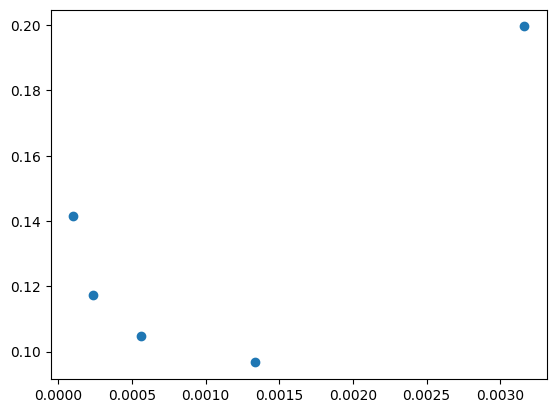

In [20]:
plt.plot(amplitudes_list, error_RBF_list, label='RBF',marker ='o', linestyle='')
plt.show()

In [21]:
amplitudes_list

array([0.0001    , 0.00023714, 0.00056234, 0.00133352, 0.00316228])

In [22]:
'''
fig, ax = plt.subplots(n_samples_oscillatory_test, 1, figsize=(50,5 * n_samples_oscillatory_test))
for i in range(n_samples_oscillatory_test):
    ax[i].plot(preds_all[i], label='Predicted')
    ax[i].set_title("Predicted forcing function")
    ax[i].plot(f_data_test[i], label='True')
'''

'\nfig, ax = plt.subplots(n_samples_oscillatory_test, 1, figsize=(50,5 * n_samples_oscillatory_test))\nfor i in range(n_samples_oscillatory_test):\n    ax[i].plot(preds_all[i], label=\'Predicted\')\n    ax[i].set_title("Predicted forcing function")\n    ax[i].plot(f_data_test[i], label=\'True\')\n'

#### 2. smoothing: RBF, Predictor: Poly1

In [ ]:
np.random.seed(7)

n_samples_oscillatory = 20
# amplitudes = 10 ** (np.random.uniform(-3, -2.5, n_samples_oscillatory))

amplitudes_list = 10 ** (np.random.uniform(-3, -2.5, 5))
amplitudes_list = np.sort(amplitudes_list)

error_linear_list = []
for amplitude_train in amplitudes_list:

    amplitudes = np.full(n_samples_oscillatory,amplitude_train)

    ## Training data
    np.random.seed(7)
    shifts = np.random.uniform(0, np.pi, n_samples_oscillatory)
    frequencies = np.random.uniform(1, 6, n_samples_oscillatory)
    forcing_functions = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitudes, shifts, frequencies)]
    grids_oscillatory = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory)]
    for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory, amplitudes, shifts, frequencies, forcing_functions):
        sim(grid, forcing = fn)

    grids_all = grids_oscillatory

    smoothed_data = []
    smoothed_derivatives = []
    alphas_list = [[0], [1], [2]]

    x_data = np.stack([grid.grid_tensors[0] for grid in grids_all])
    x_mean = np.mean(x_data)
    x_std = np.std(x_data)
    x_data = (x_data - x_mean) / x_std

    y_data = np.stack([grid.grid_tensors_values for grid in grids_all])
    f_data = np.stack([grid.grid_tensors_forcing for grid in grids_all])


    ## Test data
    np.random.seed(1947)

    n_samples_oscillatory_test = 50
    amplitude_test = np.full(n_samples_oscillatory_test,amplitude_train)
    shift_test = np.random.uniform(0, np.pi, n_samples_oscillatory_test)
    frequencies_test = np.random.uniform(1, 6, n_samples_oscillatory_test)

    forcing_functions_test = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitude_test, shift_test, frequencies_test)]
    grids_oscillatory_test = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory_test)]

    for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory_test, amplitude_test, shift_test, frequencies_test, forcing_functions_test):
        sim(grid, forcing = fn)


    x_data_test = np.stack([grid.grid_tensors[0] for grid in grids_oscillatory_test])
    x_data_test = (x_data_test - x_mean) / x_std

    y_data_test = np.stack([grid.grid_tensors_values for grid in grids_oscillatory_test])
    f_data_test = np.stack([grid.grid_tensors_forcing for grid in grids_oscillatory_test])


    ## Smoothing the training data
    z, kdList, u_smoothed = KBio.kernel_smoothing(Gaus1, x_grid = x_data, u_data = y_data, f_data = f_data, alpha_list=alphas_list, nugget=1e-8)

    x_grid_list = grid.grid_list  # Get the grid of points as a list

    ## Assembling the features for the training data
    F0 = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed[0], multi_derivatives=u_smoothed, function_list=feature_functions)
    f_data_flat = f_data.reshape(-1, 1)

    F0_mean = np.mean(F0, axis=0)
    F0_std = np.std(F0, axis=0)
    F0 = np.divide((F0 - F0_mean), F0_std, where = (F0_std != 0))

    ## Learning the predictor
    predictor, weight_vector = KBio.learn_DE_form(kernel=lin, s_features=F0, f_labels=f_data_flat, nugget=1e-1)

    ## Smoothing the test data
    z_test, kdList_test, u_smoothed_test = KBio.kernel_smoothing(Gaus1, x_grid = x_data_test, u_data = y_data_test, f_data = f_data_test, alpha_list=alphas_list, nugget=1e-14)

    ## Assembling the features for the test data
    F0_test = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed_test[0], multi_derivatives=u_smoothed_test, function_list=feature_functions, flatten=False)
    F0_test = np.divide((F0_test - F0_mean), F0_std, where = (F0_std != 0))

    ## Computing the kernel matrix for the test data
    s_test = np.zeros((F0_test.shape[1], F0_test.shape[1]))
    for i in range(F0_test.shape[1]):
        for j in range(F0_test.shape[1]):
            s_test[i,j] = lin(F0_test[0,i,:], F0_test[0,j,:] )

    ## Predicting the test data
    preds_all = []
    for i in range(F0_test.shape[0]):
        print(i)
        k_new, preds = predictor(F0_test[i,:,:])
        preds_all.append(preds)


    ## compute errors

    error_linear = []
    for i in range(n_samples_oscillatory_test):
        error_linear.append(np.linalg.norm(preds_all[i] - f_data_test[i].reshape(-1, 1)) / np.linalg.norm(f_data_test[i].reshape(-1, 1)))

    error_linear = sum(error_linear) / n_samples_oscillatory_test
    error_linear_list.append(error_linear)

In [ ]:
error_linear_list

In [ ]:
plt.plot(amplitudes_list, error_linear_list, label='Linear',marker ='o', linestyle='')

In [ ]:
amplitudes_list

In [ ]:
fig, ax = plt.subplots(n_samples_oscillatory_test, 1, figsize=(50,5 * n_samples_oscillatory_test))
for i in range(n_samples_oscillatory_test):
    ax[i].plot(preds_all[i], label='Predicted')
    ax[i].set_title("Predicted forcing function")
    ax[i].plot(f_data_test[i], label='True')

In [ ]:
plt.plot(amplitudes_list, error_RBF_list, marker = 'o', linestyle='')
plt.plot(amplitudes_list, error_linear_list, marker = 'x', linestyle='')
plt.show()

### 3. smoothing: RBF, predict: poly_quad

In [ ]:
np.random.seed(7)

n_samples_oscillatory = 20
# amplitudes = 10 ** (np.random.uniform(-3, -2.5, n_samples_oscillatory))

amplitudes_list = 10 ** (np.random.uniform(-3, -2.5, 5))
amplitudes_list = np.sort(amplitudes_list)

error_quad_list = []
for amplitude_train in amplitudes_list:

    amplitudes = np.full(n_samples_oscillatory,amplitude_train)

    ## Training data
    np.random.seed(7)
    shifts = np.random.uniform(0, np.pi, n_samples_oscillatory)
    frequencies = np.random.uniform(1, 6, n_samples_oscillatory)
    forcing_functions = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitudes, shifts, frequencies)]
    grids_oscillatory = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory)]
    for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory, amplitudes, shifts, frequencies, forcing_functions):
        sim(grid, forcing = fn)

    grids_all = grids_oscillatory

    smoothed_data = []
    smoothed_derivatives = []
    alphas_list = [[0], [1], [2]]

    x_data = np.stack([grid.grid_tensors[0] for grid in grids_all])
    x_mean = np.mean(x_data)
    x_std = np.std(x_data)
    x_data = (x_data - x_mean) / x_std

    y_data = np.stack([grid.grid_tensors_values for grid in grids_all])
    f_data = np.stack([grid.grid_tensors_forcing for grid in grids_all])


    ## Test data
    np.random.seed(1947)

    n_samples_oscillatory_test = 50
    amplitude_test = np.full(n_samples_oscillatory_test,amplitude_train)
    shift_test = np.random.uniform(0, np.pi, n_samples_oscillatory_test)
    frequencies_test = np.random.uniform(1, 6, n_samples_oscillatory_test)

    forcing_functions_test = [partial(oscillatory_forcing, amplitude, shift, frequency) for amplitude, shift, frequency in zip(amplitude_test, shift_test, frequencies_test)]
    grids_oscillatory_test = [KBio.rectangular_grid([0], [30], [301]) for _ in range(n_samples_oscillatory_test)]

    for grid, amplitude, shift, frequency, fn in zip(grids_oscillatory_test, amplitude_test, shift_test, frequencies_test, forcing_functions_test):
        sim(grid, forcing = fn)


    x_data_test = np.stack([grid.grid_tensors[0] for grid in grids_oscillatory_test])
    x_data_test = (x_data_test - x_mean) / x_std

    y_data_test = np.stack([grid.grid_tensors_values for grid in grids_oscillatory_test])
    f_data_test = np.stack([grid.grid_tensors_forcing for grid in grids_oscillatory_test])


    ## Smoothing the training data
    z, kdList, u_smoothed = KBio.kernel_smoothing(Gaus1, x_grid = x_data, u_data = y_data, f_data = f_data, alpha_list=alphas_list, nugget=1e-8)

    x_grid_list = grid.grid_list  # Get the grid of points as a list

    ## Assembling the features for the training data
    F0 = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed[0], multi_derivatives=u_smoothed, function_list=feature_functions)
    f_data_flat = f_data.reshape(-1, 1)

    F0_mean = np.mean(F0, axis=0)
    F0_std = np.std(F0, axis=0)
    F0 = np.divide((F0 - F0_mean), F0_std, where = (F0_std != 0))

    ## Learning the predictor
    predictor, weight_vector = KBio.learn_DE_form(kernel=poly_quad, s_features=F0, f_labels=f_data_flat, nugget=1e-1)

    ## Smoothing the test data
    z_test, kdList_test, u_smoothed_test = KBio.kernel_smoothing(Gaus1, x_grid = x_data_test, u_data = y_data_test, f_data = f_data_test, alpha_list=alphas_list, nugget=1e-14)

    ## Assembling the features for the test data
    F0_test = KBio.assemble_features(x_grid_list=x_grid_list, u_smoothed=u_smoothed_test[0], multi_derivatives=u_smoothed_test, function_list=feature_functions, flatten=False)
    F0_test = np.divide((F0_test - F0_mean), F0_std, where = (F0_std != 0))

    ## Computing the kernel matrix for the test data
    s_test = np.zeros((F0_test.shape[1], F0_test.shape[1]))
    for i in range(F0_test.shape[1]):
        for j in range(F0_test.shape[1]):
            s_test[i,j] = poly_quad(F0_test[0,i,:], F0_test[0,j,:] )

    ## Predicting the test data
    preds_all = []
    for i in range(F0_test.shape[0]):
        print(i)
        k_new, preds = predictor(F0_test[i,:,:])
        preds_all.append(preds)


    ## compute errors

    error_quad = []
    for i in range(n_samples_oscillatory_test):
        error_quad.append(np.linalg.norm(preds_all[i] - f_data_test[i].reshape(-1, 1)) / np.linalg.norm(f_data_test[i].reshape(-1, 1)))

    error_quad = sum(error_quad) / n_samples_oscillatory_test
    error_quad_list.append(error_quad)

In [ ]:
error_quad_list

In [ ]:
plt.plot(amplitudes_list, error_RBF_list, marker = 'o', linestyle='')
plt.plot(amplitudes_list, error_linear_list, marker = 'x', linestyle='')
plt.plot(amplitudes_list, error_quad_list, marker = 's', linestyle='')
plt.legend('RBF', 'Linear', 'Quadratic')
plt.show()

In [38]:
fig, ax = plt.subplots(n_samples_oscillatory_test, 1, figsize=(50,5 * n_samples_oscillatory_test))
for i in range(n_samples_oscillatory_test):
    ax[i].plot(preds_all[i], label='Predicted')
    ax[i].set_title("Predicted forcing function")
    ax[i].plot(f_data_test[i], label='True')